In [191]:
import shutil
from shutil import get_terminal_size
import os
import kagglehub
from tqdm import tqdm

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import nltk
import re

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

from textblob import TextBlob


from sklearn.model_selection import train_test_split

from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences


from sklearn.multioutput import MultiOutputClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import MultiLabelBinarizer

import ast

import joblib
import warnings
warnings.filterwarnings('ignore')

import torch
import torch.nn as nn
import torch.nn.functional as F

In [11]:
goemotion_df1 = pd.read_csv("/content/goemotions_1.csv")
goemotion_df2 = pd.read_csv("/content/goemotions_2.csv")
goemotion_df3 = pd.read_csv("/content/goemotions_3.csv")

In [25]:
df = pd.concat([goemotion_df1, goemotion_df2, goemotion_df3], axis=0, ignore_index=True)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 211225 entries, 0 to 211224
Data columns (total 37 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   text                  211225 non-null  object 
 1   id                    211225 non-null  object 
 2   author                211225 non-null  object 
 3   subreddit             211225 non-null  object 
 4   link_id               211225 non-null  object 
 5   parent_id             211225 non-null  object 
 6   created_utc           211225 non-null  float64
 7   rater_id              211225 non-null  int64  
 8   example_very_unclear  211225 non-null  bool   
 9   admiration            211225 non-null  int64  
 10  amusement             211225 non-null  int64  
 11  anger                 211225 non-null  int64  
 12  annoyance             211225 non-null  int64  
 13  approval              211225 non-null  int64  
 14  caring                211225 non-null  int64  
 15  

In [26]:
print(len(df))
df = df[df['example_very_unclear'] == False] # uncler = True인 row 제거
print(len(df))
df = df.dropna(subset=['text'])
print(len(df))

211225
207814
207814


In [27]:
duplicates = df['text'][df['text'].duplicated()]
print("중복된 값:")
print(duplicates.unique())
print(len(duplicates))

중복된 값:
['[NAME] to [NAME]: "Don\'t try and tell me how to defend"'
 '"Sponge Blurb Pubs Quaw Haha GURR ha AAa!" finale is too real'
 "You're both wrong NBA is an initialism, can't be pronounced as a word. Oh man I love reddit"
 ...
 'Not true. backtested analysis shows that 85% stocks 15% bonds provides better returns.'
 'Everyone likes [NAME].'
 'Well when you’ve imported about a gazillion of them I or your country it’s gets serious.']
150084


In [28]:
df.drop_duplicates(subset=['text'], inplace=True)
print(len(df))

57730


In [38]:
df.columns
df = df.drop(['id', 'author', 'subreddit', 'link_id', 'parent_id', 'created_utc', 'rater_id', 'example_very_unclear'], axis=1)
df.columns

Index(['text', 'admiration', 'amusement', 'anger', 'annoyance', 'approval',
       'caring', 'confusion', 'curiosity', 'desire', 'disappointment',
       'disapproval', 'disgust', 'embarrassment', 'excitement', 'fear',
       'gratitude', 'grief', 'joy', 'love', 'nervousness', 'optimism', 'pride',
       'realization', 'relief', 'remorse', 'sadness', 'surprise', 'neutral'],
      dtype='object')

In [39]:
for col in df.loc[:,"admiration":"neutral"]:
    group_df = df.groupby(col).size().reset_index(name='count')
    # 열 이름 길이를 통일
    group_df.columns = [col.ljust(16), 'count']  # 12는 길이 조정
    print(group_df)

   admiration        count
0                 0  52856
1                 1   4874
   amusement         count
0                 0  55046
1                 1   2684
   anger             count
0                 0  55488
1                 1   2242
   annoyance         count
0                 0  54196
1                 1   3534
   approval          count
0                 0  52832
1                 1   4898
   caring            count
0                 0  56119
1                 1   1611
   confusion         count
0                 0  55707
1                 1   2023
   curiosity         count
0                 0  54922
1                 1   2808
   desire            count
0                 0  56716
1                 1   1014
   disappointment    count
0                 0  55537
1                 1   2193
   disapproval       count
0                 0  54624
1                 1   3106
   disgust           count
0                 0  56362
1                 1   1368
   embarrassment     count
0

In [40]:
df.isnull().values.any()

False

In [50]:
nltk.download('punkt_tab')
nltk.download('stopwords')
nltk.download('wordnet')

def preprocess_text(text):
    # 1. 소문자 변환
    text = text.lower()

    # 2. 특수 문자, 숫자 제거
    text = re.sub(r'[^a-z\s]', '', text)

    # 3. 토큰화
    tokens = word_tokenize(text)

    # 4. 불용어 제거
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]

    # 5. Lemmatization (원형 복원)
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(word) for word in tokens]

    # 전처리된 텍스트 반환
    return ' '.join(tokens)

[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...


In [51]:
df['text'] = df['text'].apply(str)
df['text'] = df['text'].apply(preprocess_text)

In [52]:
df.isnull().values.any()

False

In [54]:
len(df)

57730

In [56]:
df = df[~(df.loc[:, 'admiration':'neutral'].sum(axis=1) == 0)]

In [57]:
len(df)

57730

In [58]:
texts = df['text']
emotions = df.loc[:, 'admiration':'neutral']

In [60]:
print(type(texts), type(emotions))

<class 'pandas.core.series.Series'> <class 'pandas.core.frame.DataFrame'>


In [61]:
X_train, X_test, y_train, y_test = train_test_split(texts, emotions, test_size=0.2, random_state=42)


## LSTM Model

In [65]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import MultiLabelBinarizer

In [66]:
# 텍스트 토큰화 및 시퀀스 변환
tokenizer = Tokenizer(num_words=10000)  # 최대 5000개의 단어만 고려
tokenizer.fit_on_texts(X_train)

X_train_seq = tokenizer.texts_to_sequences(X_train)
X_test_seq = tokenizer.texts_to_sequences(X_test)

# 시퀀스 길이를 동일하게 패딩
max_seq_length = 100
X_train_pad = pad_sequences(X_train_seq, maxlen=max_seq_length, padding='post')
X_test_pad = pad_sequences(X_test_seq, maxlen=max_seq_length, padding='post')

357

In [68]:
X_train_tensor = torch.tensor(X_train_pad, dtype=torch.long)
X_test_tensor = torch.tensor(X_test_pad, dtype=torch.long)

y_train_array = y_train.to_numpy()  # 또는 y_train.values
y_test_array = y_test.to_numpy()

# PyTorch 텐서로 변환
y_train_tensor = torch.tensor(y_train_array, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_array, dtype=torch.float32)

In [69]:
class EmotionDataset(Dataset):
    def __init__(self, texts, labels):
        self.texts = texts
        self.labels = labels

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        return self.texts[idx], self.labels[idx]

train_dataset = EmotionDataset(X_train_tensor, y_train_tensor)
test_dataset = EmotionDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


In [70]:
class LSTMEmotionModel(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim):
        super(LSTMEmotionModel, self).__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, batch_first=True)
        self.fc = nn.Linear(hidden_dim, output_dim)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        embedded = self.embedding(x)
        lstm_out, _ = self.lstm(embedded)
        last_hidden_state = lstm_out[:, -1, :]  # 마지막 시퀀스의 hidden state
        output = self.fc(last_hidden_state)
        return self.sigmoid(output)

# 모델 초기화
vocab_size = 10000  # 최대 단어 수
embedding_dim = 128
hidden_dim = 64
output_dim = y_train.shape[1]  # 감정 레이블 수

model = LSTMEmotionModel(vocab_size, embedding_dim, hidden_dim, output_dim)


In [74]:
output_dim

28

In [80]:
criterion = nn.BCELoss()  # Binary Cross-Entropy Loss
optimizer = optim.Adam(model.parameters(), lr=0.001)


In [192]:
from tqdm import tqdm

# 학습 루프
epochs = 50
for epoch in range(epochs):
    model.train()
    total_loss = 0
    progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}")

    for texts, labels in progress_bar:
        texts, labels = texts.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(texts)

        print(outputs)

        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        progress_bar.set_postfix(loss=f"{loss.item():.4f}")

    avg_loss = total_loss / len(train_loader)

print(f"Average Loss: {avg_loss:.4f}")


Epoch 1/50:   0%|          | 0/1444 [00:00<?, ?it/s]


AttributeError: 'tuple' object has no attribute 'size'

In [96]:
# 모델 출력 (logits)
logits = model(texts)
print("Raw Logits:", logits)

# Sigmoid를 적용한 확률
probabilities = torch.sigmoid(logits)
print("Probabilities:", probabilities)

Raw Logits: tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.

In [105]:
from sklearn.metrics import multilabel_confusion_matrix

# 평가 루프
model.eval()
total_loss = 0
all_labels = []
all_preds = []

progress_bar = tqdm(test_loader, desc="Evaluating")

with torch.no_grad():
    for texts, labels in progress_bar:
        texts, labels = texts.to(device), labels.to(device)
        outputs = model(texts)


        loss = criterion(outputs, labels)
        total_loss += loss.item()


        preds = (outputs > 0.50).float()
        print(outputs)

        all_labels.append(labels.cpu())
        all_preds.append(preds.cpu())

        progress_bar.set_postfix(loss=f"{loss.item():.4f}")

avg_loss = total_loss / len(test_loader)
print(f"Test Loss: {avg_loss:.4f}")

# Tensor를 Numpy 배열로 변환
all_labels = torch.cat(all_labels).numpy()
all_preds = torch.cat(all_preds).numpy()



Evaluating:   3%|▎         | 10/361 [00:00<00:07, 44.52it/s, loss=0.1840]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:   4%|▍         | 15/361 [00:00<00:07, 43.97it/s, loss=0.1585]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:   7%|▋         | 25/361 [00:00<00:07, 43.78it/s, loss=0.1690]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  10%|▉         | 35/361 [00:00<00:07, 43.83it/s, loss=0.1626]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  12%|█▏        | 45/361 [00:01<00:07, 43.75it/s, loss=0.1637]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  15%|█▌        | 55/361 [00:01<00:07, 42.65it/s, loss=0.1499]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  18%|█▊        | 65/361 [00:01<00:06, 44.00it/s, loss=0.1758]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  21%|██        | 75/361 [00:01<00:06, 44.64it/s, loss=0.1607]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  24%|██▎       | 85/361 [00:01<00:06, 44.88it/s, loss=0.1593]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  25%|██▍       | 90/361 [00:02<00:06, 44.12it/s, loss=0.1547]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  28%|██▊       | 100/361 [00:02<00:05, 45.24it/s, loss=0.1819]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  30%|███       | 110/361 [00:02<00:05, 45.85it/s, loss=0.1580]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  33%|███▎      | 120/361 [00:02<00:05, 46.41it/s, loss=0.1476]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  36%|███▌      | 130/361 [00:02<00:05, 45.00it/s, loss=0.1831]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  39%|███▉      | 140/361 [00:03<00:05, 42.86it/s, loss=0.1907]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  42%|████▏     | 150/361 [00:03<00:04, 43.19it/s, loss=0.1832]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  44%|████▍     | 160/361 [00:03<00:04, 43.38it/s, loss=0.1451]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  46%|████▌     | 165/361 [00:03<00:04, 42.87it/s, loss=0.2020]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  48%|████▊     | 175/361 [00:04<00:04, 43.06it/s, loss=0.1717]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  51%|█████     | 185/361 [00:04<00:04, 43.16it/s, loss=0.1719]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  54%|█████▍    | 195/361 [00:04<00:03, 44.21it/s, loss=0.1669]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  57%|█████▋    | 205/361 [00:04<00:03, 44.28it/s, loss=0.1724]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  60%|█████▉    | 215/361 [00:04<00:03, 44.32it/s, loss=0.1793]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  61%|██████    | 220/361 [00:05<00:03, 43.95it/s, loss=0.1558]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  64%|██████▎   | 230/361 [00:05<00:03, 41.41it/s, loss=0.1743]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  66%|██████▋   | 240/361 [00:05<00:02, 44.13it/s, loss=0.1489]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  69%|██████▉   | 250/361 [00:05<00:02, 45.24it/s, loss=0.1513]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  72%|███████▏  | 260/361 [00:05<00:02, 45.34it/s, loss=0.1729]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  75%|███████▍  | 270/361 [00:06<00:02, 44.58it/s, loss=0.1588]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  78%|███████▊  | 280/361 [00:06<00:01, 44.18it/s, loss=0.1660]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  80%|████████  | 290/361 [00:06<00:01, 45.28it/s, loss=0.1730]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  83%|████████▎ | 300/361 [00:06<00:01, 44.61it/s, loss=0.1720]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  86%|████████▌ | 310/361 [00:07<00:01, 42.34it/s, loss=0.1549]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  87%|████████▋ | 315/361 [00:07<00:01, 41.63it/s, loss=0.1528]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  90%|█████████ | 325/361 [00:07<00:00, 41.93it/s, loss=0.1750]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  93%|█████████▎| 335/361 [00:07<00:00, 41.75it/s, loss=0.1454]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  96%|█████████▌| 345/361 [00:07<00:00, 40.11it/s, loss=0.1373]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating:  97%|█████████▋| 350/361 [00:08<00:00, 40.02it/s, loss=0.1585]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

Evaluating: 100%|██████████| 361/361 [00:08<00:00, 43.50it/s, loss=0.1778]

tensor([[0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040, 0.0186, 0.0658, 0.0521,
         0.2988],
        [0.0536, 0.0432, 0.0347, 0.0439, 0.0773, 0.0249, 0.0360, 0.0820, 0.0195,
         0.0389, 0.0364, 0.0249, 0.0125, 0.0209, 0.0113, 0.0472, 0.0058, 0.0196,
         0.0720, 0.0107, 0.0289, 0.0027, 0.0593, 0.0040

In [101]:
for pr in all_preds:
    print(pr)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1.]
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 1.]
[0. 0. 

                admiration  amusement  anger  annoyance  approval  caring  \
admiration               0          0      0          0         0       0   
amusement                0          0      0          0         0       0   
anger                    0          0      0          0         0       0   
annoyance                0          0      0          0         0       0   
approval                 0          0      0          0         0       0   
caring                   0          0      0          0         0       0   
confusion                0          0      0          0         0       0   
curiosity                0          0      0          0         0       0   
desire                   0          0      0          0         0       0   
disappointment           0          0      0          0         0       0   
disapproval              0          0      0          0         0       0   
disgust                  0          0      0          0         0       0   

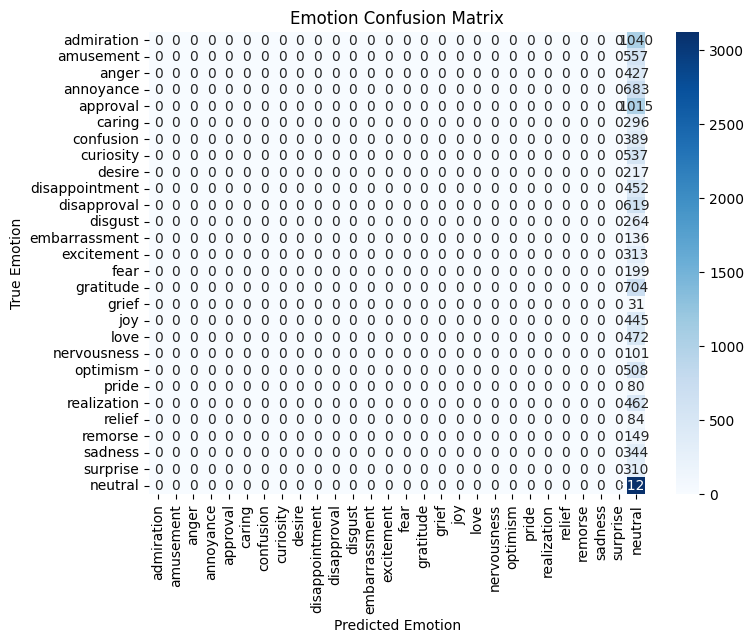

In [100]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

def calculate_emotion_confusion_matrix(true_labels, predicted_labels, label_names):
    """
    Calculate a confusion matrix where rows are true emotions and columns are predicted emotions.

    Args:
        true_labels (np.ndarray): True emotion labels (binary array).
        predicted_labels (np.ndarray): Predicted emotion labels (binary array).
        label_names (list): List of emotion label names.

    Returns:
        pd.DataFrame: Confusion matrix as a DataFrame.
    """
    num_labels = len(label_names)
    matrix = np.zeros((num_labels, num_labels), dtype=int)

    # Iterate through each sample
    for true, pred in zip(true_labels, predicted_labels):
        true_indices = np.where(true == 1)[0]  # True labels
        pred_indices = np.where(pred == 1)[0]  # Predicted labels

        # Update matrix for all true-predicted combinations
        for t in true_indices:
            for p in pred_indices:
                matrix[t, p] += 1

    return pd.DataFrame(matrix, index=label_names, columns=label_names)

# 레이블 이름
emotion_labels = ['admiration', 'amusement', 'anger', 'annoyance', 'approval',
       'caring', 'confusion', 'curiosity', 'desire', 'disappointment',
       'disapproval', 'disgust', 'embarrassment', 'excitement', 'fear',
       'gratitude', 'grief', 'joy', 'love', 'nervousness', 'optimism', 'pride',
       'realization', 'relief', 'remorse', 'sadness', 'surprise', 'neutral']  # 예시

# Confusion Matrix 계산
conf_matrix_df = calculate_emotion_confusion_matrix(all_labels, all_preds, emotion_labels)

# Confusion Matrix 출력
print(conf_matrix_df)

# Confusion Matrix 시각화
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix_df, annot=True, fmt="d", cmap="Blues", xticklabels=emotion_labels, yticklabels=emotion_labels)
plt.title("Emotion Confusion Matrix")
plt.xlabel("Predicted Emotion")
plt.ylabel("True Emotion")
plt.show()


- 모든 test input text에 대해 'neutral'로 predict 해버림
- emotion label에서 다른 emotion 대비 'neutral' emotion의 0 / 1 비율이 굉장히 높아(2:1) model이 dominant한 label인 'neutral'을 우선적으로 예측하게 되는 것으로 보임
- 데이터 불균형으로 인한 문제
    - loss func에 가중치를 부여하거나
    - data resampling으로 비율을 맞추거나
    - dropout, threshold 조절
    - model learning rate을 조절할 수 있음
- 그러나 그보다는, emotion labels에서 'neutral'을 제거하고 다른 감정들로만 학습 및 평가를 다시 진행해보기로 함
    - model 학습 효율 증가
    - model 해석 가능성 향상
    - 지식기반, 확률기반 방법과의 상호보완
    

In [115]:
# 1. 'neutral'이 1인 row 제거
df_filtered = df.drop('neutral', axis=1)

# 2. 다른 감정들이 모두 0인 row 제거
# 감정 레이블 컬럼 (neutral을 제외한 컬럼 리스트)
emotion_columns = [col for col in df.columns if col not in ['text', 'neutral']]

# 모든 감정 값이 0인 row 제거
df_filtered = df_filtered[df_filtered[emotion_columns].sum(axis=1) > 0]

# 결과 확인
print(f"Filtered DataFrame Shape: {df_filtered.shape}")

Filtered DataFrame Shape: (41927, 28)


In [116]:
df_filtered.head()

,text,admiration,amusement,anger,annoyance,approval,caring,confusion,curiosity,desire,...,joy,love,nervousness,optimism,pride,realization,relief,remorse,sadness,surprise
0,game hurt,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
3,man love reddit,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
5,right considering important document know damn...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,isnt big he still quite popular ive heard thin...,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,thats crazy went super religion high school th...,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [117]:
texts = df['text']
emotions = df.loc[:, 'admiration':'surprise']

In [118]:
X_train, X_test, y_train, y_test = train_test_split(texts, emotions, test_size=0.2, random_state=42)


In [119]:
# 텍스트 토큰화 및 시퀀스 변환
tokenizer = Tokenizer(num_words=10000)  # 최대 5000개의 단어만 고려
tokenizer.fit_on_texts(X_train)

X_train_seq = tokenizer.texts_to_sequences(X_train)
X_test_seq = tokenizer.texts_to_sequences(X_test)

# 시퀀스 길이를 동일하게 패딩
max_seq_length = 100
X_train_pad = pad_sequences(X_train_seq, maxlen=max_seq_length, padding='post')
X_test_pad = pad_sequences(X_test_seq, maxlen=max_seq_length, padding='post')

In [120]:
X_train_tensor = torch.tensor(X_train_pad, dtype=torch.long)
X_test_tensor = torch.tensor(X_test_pad, dtype=torch.long)

y_train_array = y_train.to_numpy()  # 또는 y_train.values
y_test_array = y_test.to_numpy()

# PyTorch 텐서로 변환
y_train_tensor = torch.tensor(y_train_array, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_array, dtype=torch.float32)

In [130]:
train_dataset = EmotionDataset(X_train_tensor, y_train_tensor)
test_dataset = EmotionDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [131]:
# 모델 초기화
vocab_size = 10000  # 최대 단어 수
embedding_dim = 128
hidden_dim = 64
output_dim = y_train.shape[1]  # 감정 레이블 수

model = LSTMEmotionModel(vocab_size, embedding_dim, hidden_dim, output_dim)
model = model.to(device)

In [132]:
epochs = 50
for epoch in range(epochs):
    model.train()
    total_loss = 0
    progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}")

    for texts, labels in progress_bar:
        texts, labels = texts.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = model(texts)

        # print(outputs)

        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        progress_bar.set_postfix(loss=f"{loss.item():.4f}")

    avg_loss = total_loss / len(train_loader)

print(f"Average Loss: {avg_loss:.4f}")


Epoch 50/50: 100%|██████████| 1444/1444 [00:06<00:00, 230.71it/s, loss=0.7098]


Average Loss: 0.7149


In [133]:
model.eval()
total_loss = 0
all_labels = []
all_preds = []

progress_bar = tqdm(test_loader, desc="Evaluating")

with torch.no_grad():
    for texts, labels in progress_bar:
        texts, labels = texts.to(device), labels.to(device)
        outputs = model(texts)


        loss = criterion(outputs, labels)
        total_loss += loss.item()


        preds = (outputs > 0.50).float()
        print(outputs)

        all_labels.append(labels.cpu())
        all_preds.append(preds.cpu())

        progress_bar.set_postfix(loss=f"{loss.item():.4f}")

avg_loss = total_loss / len(test_loader)
print(f"Test Loss: {avg_loss:.4f}")

# Tensor를 Numpy 배열로 변환
all_labels = torch.cat(all_labels).numpy()
all_preds = torch.cat(all_preds).numpy()



Evaluating:   3%|▎         | 10/361 [00:00<00:07, 46.86it/s, loss=0.7157]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:   6%|▌         | 20/361 [00:00<00:07, 46.58it/s, loss=0.7155]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:   8%|▊         | 30/361 [00:00<00:07, 46.74it/s, loss=0.7167]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  11%|█         | 40/361 [00:00<00:06, 46.76it/s, loss=0.7141]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  12%|█▏        | 45/361 [00:01<00:06, 45.76it/s, loss=0.7165]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  15%|█▌        | 55/361 [00:01<00:06, 45.11it/s, loss=0.7142]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  18%|█▊        | 65/361 [00:01<00:06, 44.32it/s, loss=0.7143]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  21%|██        | 75/361 [00:01<00:06, 45.14it/s, loss=0.7146]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  24%|██▎       | 85/361 [00:01<00:05, 46.40it/s, loss=0.7136]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  26%|██▋       | 95/361 [00:02<00:05, 46.48it/s, loss=0.7162]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  29%|██▉       | 105/361 [00:02<00:05, 45.68it/s, loss=0.7143]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4929, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  32%|███▏      | 115/361 [00:02<00:05, 46.37it/s, loss=0.7146]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  35%|███▍      | 125/361 [00:02<00:05, 46.26it/s, loss=0.7152]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  37%|███▋      | 135/361 [00:02<00:04, 46.15it/s, loss=0.7144]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  40%|████      | 145/361 [00:03<00:04, 45.68it/s, loss=0.7143]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  43%|████▎     | 155/361 [00:03<00:04, 45.56it/s, loss=0.7154]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  46%|████▌     | 165/361 [00:03<00:04, 45.07it/s, loss=0.7139]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  48%|████▊     | 175/361 [00:03<00:04, 45.06it/s, loss=0.7136]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  51%|█████     | 185/361 [00:04<00:03, 45.40it/s, loss=0.7143]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  54%|█████▍    | 195/361 [00:04<00:03, 45.34it/s, loss=0.7165]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  57%|█████▋    | 205/361 [00:04<00:03, 45.27it/s, loss=0.7130]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  60%|█████▉    | 215/361 [00:04<00:03, 45.41it/s, loss=0.7150]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  62%|██████▏   | 225/361 [00:04<00:03, 45.18it/s, loss=0.7146]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  65%|██████▌   | 235/361 [00:05<00:02, 45.56it/s, loss=0.7148]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  68%|██████▊   | 245/361 [00:05<00:02, 44.48it/s, loss=0.7136]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  71%|███████   | 255/361 [00:05<00:02, 45.74it/s, loss=0.7143]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  73%|███████▎  | 265/361 [00:05<00:02, 46.92it/s, loss=0.7154]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  76%|███████▌  | 275/361 [00:06<00:01, 45.49it/s, loss=0.7156]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  79%|███████▉  | 285/361 [00:06<00:01, 46.88it/s, loss=0.7150]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  82%|████████▏ | 295/361 [00:06<00:01, 47.27it/s, loss=0.7157]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  84%|████████▍ | 305/361 [00:06<00:01, 46.83it/s, loss=0.7154]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  87%|████████▋ | 315/361 [00:06<00:00, 46.21it/s, loss=0.7127]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  90%|█████████ | 325/361 [00:07<00:00, 45.97it/s, loss=0.7150]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  91%|█████████▏| 330/361 [00:07<00:00, 45.95it/s, loss=0.7132]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  96%|█████████▌| 345/361 [00:07<00:00, 45.24it/s, loss=0.7155]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating:  98%|█████████▊| 355/361 [00:07<00:00, 45.66it/s, loss=0.7142]

tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

Evaluating: 100%|██████████| 361/361 [00:07<00:00, 45.71it/s, loss=0.7149]


tensor([[0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816, 0.4909, 0.4994, 0.4740, 0.4917, 0.5729, 0.4998, 0.5488,
         0.4587, 0.4844, 0.5037, 0.5400, 0.4651, 0.4666, 0.5024, 0.5073, 0.5137,
         0.5624, 0.5583, 0.4701, 0.5105, 0.4928, 0.5871, 0.4998, 0.4984, 0.5024],
        [0.5816, 0.4816,

In [137]:
for pr in all_preds:
    print(sum(pr))

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0
13.0

                admiration  amusement  anger  annoyance  approval  caring  \
admiration            1040          0      0          0         0       0   
amusement              557          0      0          0         0       0   
anger                  427          0      0          0         0       0   
annoyance              683          0      0          0         0       0   
approval              1015          0      0          0         0       0   
caring                 296          0      0          0         0       0   
confusion              389          0      0          0         0       0   
curiosity              537          0      0          0         0       0   
desire                 217          0      0          0         0       0   
disappointment         452          0      0          0         0       0   
disapproval            619          0      0          0         0       0   
disgust                264          0      0          0         0       0   

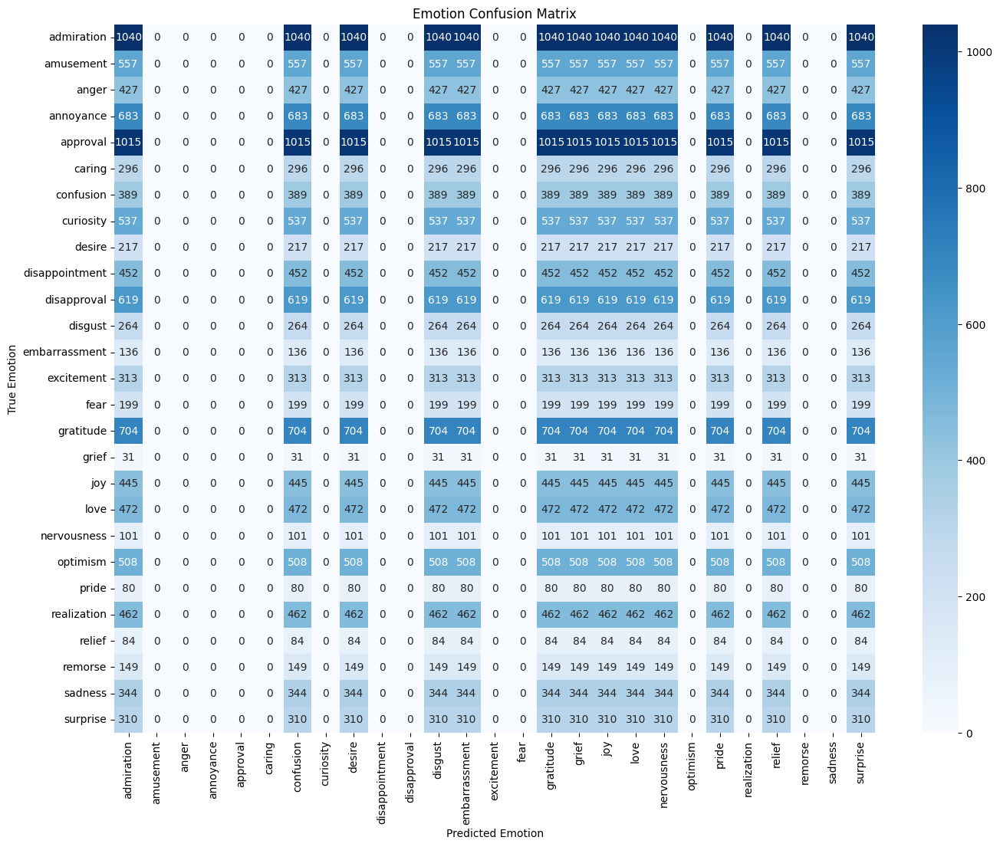

In [135]:
emotion_labels = ['admiration', 'amusement', 'anger', 'annoyance', 'approval',
       'caring', 'confusion', 'curiosity', 'desire', 'disappointment',
       'disapproval', 'disgust', 'embarrassment', 'excitement', 'fear',
       'gratitude', 'grief', 'joy', 'love', 'nervousness', 'optimism', 'pride',
       'realization', 'relief', 'remorse', 'sadness', 'surprise']  # 예시

# Confusion Matrix 계산
conf_matrix_df = calculate_emotion_confusion_matrix(all_labels, all_preds, emotion_labels)

# Confusion Matrix 출력
print(conf_matrix_df)

# Confusion Matrix 시각화
plt.figure(figsize=(16, 12))
sns.heatmap(conf_matrix_df, annot=True, fmt="d", cmap="Blues", xticklabels=emotion_labels, yticklabels=emotion_labels)
plt.title("Emotion Confusion Matrix")
plt.xlabel("Predicted Emotion")
plt.ylabel("True Emotion")
plt.show()

모델의 예측이 특정 label에 집중되고, 특정 13개의 labels로만 분류함

text data와 27개의 emotion label이라는 복잡한 data 대비 LSTM model layer가 부족하지 않을까 라는 가설

model layer를 추가하여 평가해보고자함


In [140]:
print(model)

LSTMEmotionModel(
  (embedding): Embedding(10000, 128)
  (lstm): LSTM(128, 64, batch_first=True)
  (fc): Linear(in_features=64, out_features=27, bias=True)
  (sigmoid): Sigmoid()
)


In [162]:
class DeepLSTMEmotionModel(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim, num_layers=3, dropout=0.3):
        super(DeepLSTMEmotionModel, self).__init__()
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        self.lstm = nn.LSTM(
            embedding_dim,
            hidden_dim,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout,  # LSTM 레이어 간 Dropout 추가
        )
        self.fc = nn.Linear(hidden_dim, output_dim)  # Fully Connected Layer
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        embedded = self.embedding(x)
        lstm_out, _ = self.lstm(embedded)  # LSTM 출력
        last_hidden_state = lstm_out[:, -1, :]  # 마지막 시퀀스의 hidden state 사용
        output = self.fc(last_hidden_state)
        return self.sigmoid(output)

def initialize_weights(model):
    if isinstance(model, nn.Linear):
        nn.init.xavier_uniform_(model.weight)
        if model.bias is not None:
            nn.init.zeros_(model.bias)
    elif isinstance(model, nn.LSTM):
        for name, param in model.named_parameters():
            if 'weight_ih' in name or 'weight_hh' in name:
                nn.init.xavier_uniform_(param.data)
            elif 'bias' in name:
                nn.init.zeros_(param.data)

# model.apply(initialize_weights)

deep_model = DeepLSTMEmotionModel(vocab_size, embedding_dim, hidden_dim, output_dim)
deep_model = deep_model.to(device)

In [144]:
print(deep_model)

DeepLSTMEmotionModel(
  (embedding): Embedding(10000, 128)
  (lstm): LSTM(128, 64, num_layers=3, batch_first=True, dropout=0.3)
  (fc): Linear(in_features=64, out_features=27, bias=True)
  (sigmoid): Sigmoid()
)


In [146]:
# 파라미터 수와 구조 확인
for name, param in model.named_parameters():
    print(f"Layer: {name} | Size: {param.size()} | Total Parameters: {param.numel()}")

print("___________________________________________________________________________")

for name, param in deep_model.named_parameters():
    print(f"Layer: {name} | Size: {param.size()} | Total Parameters: {param.numel()}")


Layer: embedding.weight | Size: torch.Size([10000, 128]) | Total Parameters: 1280000
Layer: lstm.weight_ih_l0 | Size: torch.Size([256, 128]) | Total Parameters: 32768
Layer: lstm.weight_hh_l0 | Size: torch.Size([256, 64]) | Total Parameters: 16384
Layer: lstm.bias_ih_l0 | Size: torch.Size([256]) | Total Parameters: 256
Layer: lstm.bias_hh_l0 | Size: torch.Size([256]) | Total Parameters: 256
Layer: fc.weight | Size: torch.Size([27, 64]) | Total Parameters: 1728
Layer: fc.bias | Size: torch.Size([27]) | Total Parameters: 27
___________________________________________________________________________
Layer: embedding.weight | Size: torch.Size([10000, 128]) | Total Parameters: 1280000
Layer: lstm.weight_ih_l0 | Size: torch.Size([256, 128]) | Total Parameters: 32768
Layer: lstm.weight_hh_l0 | Size: torch.Size([256, 64]) | Total Parameters: 16384
Layer: lstm.bias_ih_l0 | Size: torch.Size([256]) | Total Parameters: 256
Layer: lstm.bias_hh_l0 | Size: torch.Size([256]) | Total Parameters: 256
La

In [150]:
criterion = nn.BCELoss()  # Binary Cross-Entropy Loss
optimizer = optim.Adam(model.parameters(), lr=0.1)


1) lr 0.001 ->0.1:

loss 감소 안함

2) tokenization 후 padding 시 seq length 100 -> 350:

loss 감소 안함

3) 초기 parameter 초기화:

loss 감소 안함

4) embedding(GloVe):

초기 loss 크게 감소했으나, 이후 학습하면서 loss 감소 안함

5) model이 logit value를 출력하게 함:

loss 감소 안함

In [163]:
model.apply(initialize_weights)


epochs = 50
for epoch in range(epochs):
    deep_model.train()
    total_loss = 0
    progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}")

    for texts, labels in progress_bar:
        texts, labels = texts.to(device), labels.to(device)

        optimizer.zero_grad()
        outputs = deep_model(texts)

        # print(outputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()
        progress_bar.set_postfix(loss=f"{loss.item():.4f}")

    avg_loss = total_loss / len(train_loader)

print(f"Average Loss: {avg_loss:.4f}")


Epoch 50/50: 100%|██████████| 1444/1444 [00:07<00:00, 183.60it/s, loss=0.7015]

Average Loss: 0.7019


In [148]:
deep_model.eval()
total_loss = 0
all_labels = []
all_preds = []

progress_bar = tqdm(test_loader, desc="Evaluating")

with torch.no_grad():
    for texts, labels in progress_bar:
        texts, labels = texts.to(device), labels.to(device)
        outputs = deep_model(texts)


        loss = criterion(outputs, labels)
        total_loss += loss.item()


        preds = (outputs > 0.50).float()

        all_labels.append(labels.cpu())
        all_preds.append(preds.cpu())

        progress_bar.set_postfix(loss=f"{loss.item():.4f}")

avg_loss = total_loss / len(test_loader)
print(f"Test Loss: {avg_loss:.4f}")

# Tensor를 Numpy 배열로 변환
all_labels = torch.cat(all_labels).numpy()
all_preds = torch.cat(all_preds).numpy()



Evaluating:   3%|▎         | 10/361 [00:00<00:07, 49.50it/s, loss=0.7034]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:   6%|▌         | 20/361 [00:00<00:06, 48.96it/s, loss=0.7029]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:   8%|▊         | 30/361 [00:00<00:06, 48.24it/s, loss=0.7038]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  11%|█         | 40/361 [00:00<00:06, 47.54it/s, loss=0.7031]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  14%|█▍        | 50/361 [00:01<00:06, 46.92it/s, loss=0.7029]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  17%|█▋        | 60/361 [00:01<00:06, 46.99it/s, loss=0.7036]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  19%|█▉        | 70/361 [00:01<00:06, 46.86it/s, loss=0.7033]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  22%|██▏       | 80/361 [00:01<00:06, 46.77it/s, loss=0.7033]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  25%|██▍       | 90/361 [00:01<00:05, 46.32it/s, loss=0.7036]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  28%|██▊       | 100/361 [00:02<00:05, 46.21it/s, loss=0.7037]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  29%|██▉       | 105/361 [00:02<00:05, 45.38it/s, loss=0.7032]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  33%|███▎      | 120/361 [00:02<00:05, 45.53it/s, loss=0.7032]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  36%|███▌      | 130/361 [00:02<00:05, 45.75it/s, loss=0.7031]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  39%|███▉      | 140/361 [00:02<00:04, 46.24it/s, loss=0.7031]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  42%|████▏     | 150/361 [00:03<00:04, 45.83it/s, loss=0.7034]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  44%|████▍     | 160/361 [00:03<00:04, 46.85it/s, loss=0.7035]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  47%|████▋     | 170/361 [00:03<00:04, 47.13it/s, loss=0.7031]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  50%|████▉     | 180/361 [00:03<00:03, 46.13it/s, loss=0.7026]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  53%|█████▎    | 190/361 [00:04<00:03, 46.25it/s, loss=0.7038]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  54%|█████▍    | 195/361 [00:04<00:03, 46.69it/s, loss=0.7032]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  57%|█████▋    | 205/361 [00:04<00:03, 44.36it/s, loss=0.7029]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  60%|█████▉    | 215/361 [00:04<00:03, 43.99it/s, loss=0.7035]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  62%|██████▏   | 225/361 [00:04<00:03, 43.83it/s, loss=0.7032]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  65%|██████▌   | 235/361 [00:05<00:02, 42.99it/s, loss=0.7032]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  68%|██████▊   | 245/361 [00:05<00:02, 44.10it/s, loss=0.7029]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  69%|██████▉   | 250/361 [00:05<00:02, 42.98it/s, loss=0.7033]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  72%|███████▏  | 260/361 [00:05<00:02, 41.76it/s, loss=0.7033]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  75%|███████▍  | 270/361 [00:05<00:02, 42.35it/s, loss=0.7030]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  78%|███████▊  | 280/361 [00:06<00:01, 42.65it/s, loss=0.7036]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  80%|████████  | 290/361 [00:06<00:01, 44.62it/s, loss=0.7029]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  83%|████████▎ | 300/361 [00:06<00:01, 45.34it/s, loss=0.7038]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  86%|████████▌ | 310/361 [00:06<00:01, 44.36it/s, loss=0.7031]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  89%|████████▊ | 320/361 [00:07<00:00, 45.07it/s, loss=0.7031]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  91%|█████████▏| 330/361 [00:07<00:00, 45.99it/s, loss=0.7035]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  93%|█████████▎| 335/361 [00:07<00:00, 40.45it/s, loss=0.7040]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  96%|█████████▌| 345/361 [00:07<00:00, 43.04it/s, loss=0.7029]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating:  98%|█████████▊| 355/361 [00:07<00:00, 45.20it/s, loss=0.7032]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

Evaluating: 100%|██████████| 361/361 [00:07<00:00, 45.22it/s, loss=0.7032]

tensor([[0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111, 0.5189, 0.4972, 0.5065, 0.5109, 0.5023, 0.5003, 0.4780,
         0.5038, 0.5381, 0.4996, 0.5123, 0.5120, 0.4957, 0.5069, 0.4841, 0.5137,
         0.5081, 0.4960, 0.4887, 0.4923, 0.5358, 0.5245, 0.4858, 0.4921, 0.5233],
        [0.5064, 0.5111,

                admiration  amusement  anger  annoyance  approval  caring  \
admiration            1040       1040   1040          0      1040    1040   
amusement              557        557    557          0       557     557   
anger                  427        427    427          0       427     427   
annoyance              683        683    683          0       683     683   
approval              1015       1015   1015          0      1015    1015   
caring                 296        296    296          0       296     296   
confusion              389        389    389          0       389     389   
curiosity              537        537    537          0       537     537   
desire                 217        217    217          0       217     217   
disappointment         452        452    452          0       452     452   
disapproval            619        619    619          0       619     619   
disgust                264        264    264          0       264     264   

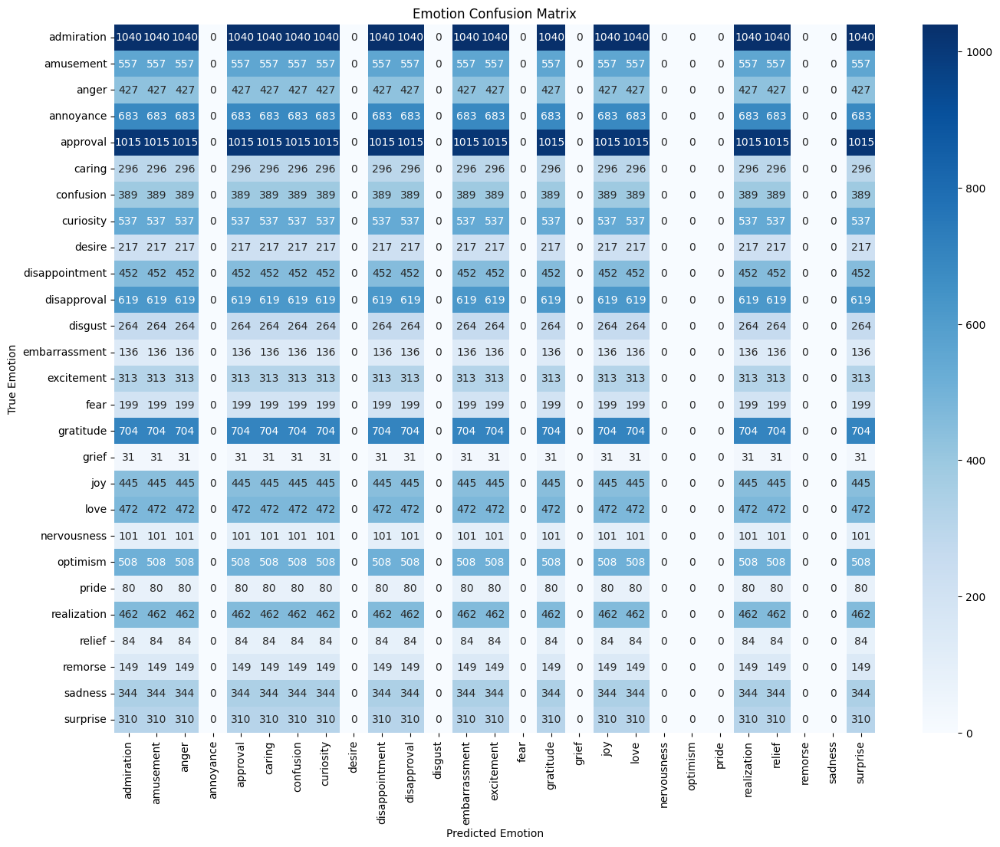

In [149]:
# lr = 0.001

emotion_labels = ['admiration', 'amusement', 'anger', 'annoyance', 'approval',
       'caring', 'confusion', 'curiosity', 'desire', 'disappointment',
       'disapproval', 'disgust', 'embarrassment', 'excitement', 'fear',
       'gratitude', 'grief', 'joy', 'love', 'nervousness', 'optimism', 'pride',
       'realization', 'relief', 'remorse', 'sadness', 'surprise']  # 예시

# Confusion Matrix 계산
conf_matrix_df = calculate_emotion_confusion_matrix(all_labels, all_preds, emotion_labels)

# Confusion Matrix 시각화
plt.figure(figsize=(16, 12))
sns.heatmap(conf_matrix_df, annot=True, fmt="d", cmap="Blues", xticklabels=emotion_labels, yticklabels=emotion_labels)
plt.title("Emotion Confusion Matrix")
plt.xlabel("Predicted Emotion")
plt.ylabel("True Emotion")
plt.show()

마찬가지로 confusion matrix는 엉망이고, train 시 loss도 줄지 않음

lr, init parameter 등의 여러 hyperparameter 검증 필요

tokenizer 과정에서 max length를 100으로 해놨는데, Data 길이에 비하면 너무 작음


In [157]:
max_seq_length = 350
X_train_pad = pad_sequences(X_train_seq, maxlen=max_seq_length, padding='post')
X_test_pad = pad_sequences(X_test_seq, maxlen=max_seq_length, padding='post')

X_train_tensor = torch.tensor(X_train_pad, dtype=torch.long)
X_test_tensor = torch.tensor(X_test_pad, dtype=torch.long)

y_train_array = y_train.to_numpy()  # 또는 y_train.values
y_test_array = y_test.to_numpy()

y_train_tensor = torch.tensor(y_train_array, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test_array, dtype=torch.float32)

train_dataset = EmotionDataset(X_train_tensor, y_train_tensor)
test_dataset = EmotionDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


array([  83, 3924, 1316,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
          0], dtype=int32)

Embedding 적용

In [164]:
def load_glove_embeddings(glove_file, vocab, embedding_dim):

    embedding_index = {}

    # GloVe 파일 로드
    with open(glove_file, "r", encoding="utf-8") as f:
        for line in f:
            values = line.split()
            word = values[0]
            vector = np.asarray(values[1:], dtype="float32")
            embedding_index[word] = vector

    # 단어 집합 크기 정의
    vocab_size = len(vocab) + 1  # 0번 인덱스는 패딩에 사용
    embedding_matrix = np.zeros((vocab_size, embedding_dim))  # 초기화

    # 단어 -> GloVe 벡터 매핑
    for word, i in vocab.items():
        if i >= vocab_size:
            continue
        embedding_vector = embedding_index.get(word)
        if embedding_vector is not None:
            embedding_matrix[i] = embedding_vector  # 매핑된 벡터 추가

    return embedding_matrix

In [188]:
# GloVe 파일 경로 및 임베딩 차원 설정
glove_file = "/content/glove.6B.100d.txt"  # GloVe 임베딩 파일 경로
embedding_dim = 100  # GloVe 벡터 차원

# 토크나이저에서 단어 집합(vocab) 가져오기
vocab = tokenizer.word_index  # 토크나이저의 단어 -> 인덱스 매핑

# GloVe 임베딩 매트릭스 생성
embedding_matrix = load_glove_embeddings(glove_file, vocab, embedding_dim)

# PyTorch 모델 정의
class ImprovedDeepLSTMEmotionModel(nn.Module):
    def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim, num_layers=3, dropout=0.3, embedding_matrix=None):
        super(ImprovedDeepLSTMEmotionModel, self).__init__()

        # Embedding Layer
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
        if embedding_matrix is not None:
            self.embedding.weight.data.copy_(torch.tensor(embedding_matrix))  # GloVe 적용
            self.embedding.weight.requires_grad = True  # GloVe 미세조정(fine-tuning) 활성화

        # Bi-LSTM Layer
        self.lstm = nn.LSTM(
            embedding_dim,
            hidden_dim,
            num_layers=num_layers,
            batch_first=True,
            dropout=dropout,
            bidirectional=True  # 양방향 LSTM
        )

        # Conv1D Layer for Feature Extraction
        self.conv1d = nn.Conv1d(hidden_dim * 2, hidden_dim, kernel_size=3, padding=1)

        # Fully Connected Layer
        self.fc = nn.Linear(hidden_dim, output_dim)

        # Dropout and BatchNorm
        self.dropout = nn.Dropout(dropout)
        self.batch_norm = nn.BatchNorm1d(hidden_dim)

        # Sigmoid for Multi-label Classification
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        # Embedding
        embedded = self.embedding(x)

        # Bi-LSTM
        lstm_out, _ = self.lstm(embedded)  # lstm_out shape: (batch, seq_len, hidden_dim * 2)

        # Conv1D
        conv_out = self.conv1d(lstm_out.permute(0, 2, 1))  # Conv1D requires (batch, channels, seq_len)
        conv_out = F.relu(conv_out)

        # Global Average Pooling
        pooled = torch.mean(conv_out, dim=2)  # shape: (batch, hidden_dim)

        # Batch Normalization
        normed = self.batch_norm(pooled)

        # Fully Connected + Dropout
        output = self.fc(self.dropout(normed))
        return self.sigmoid(output)

# 모델 생성
improved_model = ImprovedDeepLSTMEmotionModel(
    vocab_size=len(vocab) + 1,
    embedding_dim=embedding_dim,
    hidden_dim=hidden_dim,
    output_dim=output_dim,
    num_layers=3,
    dropout=0.3,
    embedding_matrix=embedding_matrix
)

improved_model = improved_model.to(device)





# # PyTorch 임베딩 레이어에 GloVe 적용
# class DeepLSTMEmotionModelWithGlove(nn.Module):
#     def __init__(self, vocab_size, embedding_dim, hidden_dim, output_dim, num_layers=3, dropout=0.3):
#         super(DeepLSTMEmotionModelWithGlove, self).__init__()
#         self.embedding = nn.Embedding(vocab_size, embedding_dim)
#         self.embedding.weight.data.copy_(torch.tensor(embedding_matrix))  # GloVe 적용
#         self.embedding.weight.requires_grad = True  # GloVe 임베딩 True (학습 가)

#         self.lstm = nn.LSTM(
#             embedding_dim,
#             hidden_dim,
#             num_layers=num_layers,
#             batch_first=True,
#             dropout=dropout,
#             bidirectional=True  # 양방향 LSTM 활성화
#         )
#         self.fc = nn.Linear(hidden_dim * 2, output_dim)
#         self.conv1d = nn.Conv1d(hidden_dim * 2, hidden_dim, kernel_size=3, padding=1)

#         self.sigmoid = nn.Sigmoid()

#     def forward(self, x):
#         embedded = self.embedding(x)
#         lstm_out, _ = self.lstm(embedded)
#         last_hidden_state = lstm_out[:, -1, :]
#         output = self.fc(last_hidden_state)
#         return output

# # 모델 생성
# deep_model_glove = DeepLSTMEmotionModelWithGlove(vocab_size=len(vocab) + 1,
#                                                  embedding_dim=embedding_dim,
#                                                  hidden_dim=hidden_dim,
#                                                  output_dim=output_dim)
# deep_model_glove = deep_model_glove.to(device)


In [189]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=2, alpha=0.25, reduction='mean'):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha
        self.reduction = reduction

    def forward(self, outputs, targets):
        # Binary Cross Entropy Loss
        bce_loss = F.binary_cross_entropy(outputs, targets, reduction='none')
        pt = torch.exp(-bce_loss)  # pt = probability of true class
        focal_loss = self.alpha * (1 - pt) ** self.gamma * bce_loss

        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss


In [196]:
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=3, factor=0.5)


criterion = FocalLoss(gamma=2, alpha=0.25)
optimizer = torch.optim.Adam(improved_model.parameters(), lr=0.001)

# 학습 루프
epochs = 100
for epoch in range(epochs):
    improved_model.train()  # 학습 모드 활성화
    total_loss = 0

    progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}")
    for texts, labels in progress_bar:
        texts, labels = texts.to(device), labels.to(device)

        optimizer.zero_grad()  # 옵티마이저 초기화
        outputs = improved_model(texts)  # 모델 출력
        loss = criterion(outputs, labels)  # 손실 계산
        loss.backward()  # 역전파
        optimizer.step()  # 가중치 업데이트

        total_loss += loss.item()
        progress_bar.set_postfix(loss=f"{loss.item():.4f}")

    avg_loss = total_loss / len(train_loader)
    print(f"Epoch {epoch+1}, Average Loss: {avg_loss:.4f}")
    scheduler.step(avg_loss)

# 학습 완료 후 모델 저장
torch.save(improved_model.state_dict(), "improved_model.pth")


Epoch 1/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.35it/s, loss=0.0040]


Epoch 1, Average Loss: 0.0061


Epoch 2/100: 100%|██████████| 1444/1444 [00:12<00:00, 117.61it/s, loss=0.0059]


Epoch 2, Average Loss: 0.0058


Epoch 3/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.98it/s, loss=0.0086]


Epoch 3, Average Loss: 0.0056


Epoch 4/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.16it/s, loss=0.0049]


Epoch 4, Average Loss: 0.0054


Epoch 5/100: 100%|██████████| 1444/1444 [00:12<00:00, 117.00it/s, loss=0.0061]


Epoch 5, Average Loss: 0.0052


Epoch 6/100: 100%|██████████| 1444/1444 [00:12<00:00, 117.06it/s, loss=0.0032]


Epoch 6, Average Loss: 0.0050


Epoch 7/100: 100%|██████████| 1444/1444 [00:12<00:00, 117.04it/s, loss=0.0031]


Epoch 7, Average Loss: 0.0048


Epoch 8/100: 100%|██████████| 1444/1444 [00:13<00:00, 110.71it/s, loss=0.0068]


Epoch 8, Average Loss: 0.0046


Epoch 9/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.06it/s, loss=0.0078]


Epoch 9, Average Loss: 0.0044


Epoch 10/100: 100%|██████████| 1444/1444 [00:12<00:00, 118.00it/s, loss=0.0025]


Epoch 10, Average Loss: 0.0043


Epoch 11/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.29it/s, loss=0.0065]


Epoch 11, Average Loss: 0.0041


Epoch 12/100: 100%|██████████| 1444/1444 [00:12<00:00, 117.49it/s, loss=0.0023]


Epoch 12, Average Loss: 0.0040


Epoch 13/100: 100%|██████████| 1444/1444 [00:12<00:00, 117.95it/s, loss=0.0033]


Epoch 13, Average Loss: 0.0038


Epoch 14/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.96it/s, loss=0.0060]


Epoch 14, Average Loss: 0.0037


Epoch 15/100: 100%|██████████| 1444/1444 [00:12<00:00, 117.18it/s, loss=0.0066]


Epoch 15, Average Loss: 0.0036


Epoch 16/100: 100%|██████████| 1444/1444 [00:12<00:00, 117.08it/s, loss=0.0038]


Epoch 16, Average Loss: 0.0034


Epoch 17/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.60it/s, loss=0.0019]


Epoch 17, Average Loss: 0.0033


Epoch 18/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.44it/s, loss=0.0105]


Epoch 18, Average Loss: 0.0032


Epoch 19/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.95it/s, loss=0.0055]


Epoch 19, Average Loss: 0.0031


Epoch 20/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.32it/s, loss=0.0019]


Epoch 20, Average Loss: 0.0030


Epoch 21/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.81it/s, loss=0.0026]


Epoch 21, Average Loss: 0.0029


Epoch 22/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.56it/s, loss=0.0041]


Epoch 22, Average Loss: 0.0028


Epoch 23/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.03it/s, loss=0.0010]


Epoch 23, Average Loss: 0.0027


Epoch 24/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.56it/s, loss=0.0022]


Epoch 24, Average Loss: 0.0027


Epoch 25/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.41it/s, loss=0.0027]


Epoch 25, Average Loss: 0.0026


Epoch 26/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.57it/s, loss=0.0015]


Epoch 26, Average Loss: 0.0025


Epoch 27/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.04it/s, loss=0.0018]


Epoch 27, Average Loss: 0.0024


Epoch 28/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.67it/s, loss=0.0014]


Epoch 28, Average Loss: 0.0024


Epoch 29/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.13it/s, loss=0.0035]


Epoch 29, Average Loss: 0.0023


Epoch 30/100: 100%|██████████| 1444/1444 [00:12<00:00, 112.71it/s, loss=0.0055]


Epoch 30, Average Loss: 0.0023


Epoch 31/100: 100%|██████████| 1444/1444 [00:14<00:00, 100.82it/s, loss=0.0013]


Epoch 31, Average Loss: 0.0022


Epoch 32/100: 100%|██████████| 1444/1444 [00:14<00:00, 99.48it/s, loss=0.0039]


Epoch 32, Average Loss: 0.0022


Epoch 33/100: 100%|██████████| 1444/1444 [00:13<00:00, 105.56it/s, loss=0.0016]


Epoch 33, Average Loss: 0.0021


Epoch 34/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.79it/s, loss=0.0009]


Epoch 34, Average Loss: 0.0020


Epoch 35/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.93it/s, loss=0.0041]


Epoch 35, Average Loss: 0.0020


Epoch 36/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.05it/s, loss=0.0020]


Epoch 36, Average Loss: 0.0020


Epoch 37/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.30it/s, loss=0.0040]


Epoch 37, Average Loss: 0.0019


Epoch 38/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.98it/s, loss=0.0030]


Epoch 38, Average Loss: 0.0019


Epoch 39/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.66it/s, loss=0.0026]


Epoch 39, Average Loss: 0.0018


Epoch 40/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.09it/s, loss=0.0022]


Epoch 40, Average Loss: 0.0018


Epoch 41/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.99it/s, loss=0.0065]


Epoch 41, Average Loss: 0.0018


Epoch 42/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.11it/s, loss=0.0018]


Epoch 42, Average Loss: 0.0017


Epoch 43/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.07it/s, loss=0.0008]


Epoch 43, Average Loss: 0.0017


Epoch 44/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.41it/s, loss=0.0050]


Epoch 44, Average Loss: 0.0017


Epoch 45/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.57it/s, loss=0.0038]


Epoch 45, Average Loss: 0.0016


Epoch 46/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.59it/s, loss=0.0017]


Epoch 46, Average Loss: 0.0016


Epoch 47/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.24it/s, loss=0.0019]


Epoch 47, Average Loss: 0.0016


Epoch 48/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.66it/s, loss=0.0013]


Epoch 48, Average Loss: 0.0016


Epoch 49/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.65it/s, loss=0.0026]


Epoch 49, Average Loss: 0.0015


Epoch 50/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.86it/s, loss=0.0014]


Epoch 50, Average Loss: 0.0015


Epoch 51/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.00it/s, loss=0.0009]


Epoch 51, Average Loss: 0.0015


Epoch 52/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.40it/s, loss=0.0019]


Epoch 52, Average Loss: 0.0015


Epoch 53/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.60it/s, loss=0.0059]


Epoch 53, Average Loss: 0.0014


Epoch 54/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.34it/s, loss=0.0014]


Epoch 54, Average Loss: 0.0014


Epoch 55/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.79it/s, loss=0.0017]


Epoch 55, Average Loss: 0.0014


Epoch 56/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.15it/s, loss=0.0028]


Epoch 56, Average Loss: 0.0014


Epoch 57/100: 100%|██████████| 1444/1444 [00:12<00:00, 113.26it/s, loss=0.0012]


Epoch 57, Average Loss: 0.0014


Epoch 58/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.41it/s, loss=0.0019]


Epoch 58, Average Loss: 0.0013


Epoch 59/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.29it/s, loss=0.0016]


Epoch 59, Average Loss: 0.0013


Epoch 60/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.34it/s, loss=0.0011]


Epoch 60, Average Loss: 0.0013


Epoch 61/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.09it/s, loss=0.0013]


Epoch 61, Average Loss: 0.0013


Epoch 62/100: 100%|██████████| 1444/1444 [00:13<00:00, 111.05it/s, loss=0.0020]


Epoch 62, Average Loss: 0.0013


Epoch 63/100: 100%|██████████| 1444/1444 [00:12<00:00, 113.38it/s, loss=0.0008]


Epoch 63, Average Loss: 0.0012


Epoch 64/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.90it/s, loss=0.0018]


Epoch 64, Average Loss: 0.0012


Epoch 65/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.24it/s, loss=0.0004]


Epoch 65, Average Loss: 0.0012


Epoch 66/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.04it/s, loss=0.0011]


Epoch 66, Average Loss: 0.0012


Epoch 67/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.79it/s, loss=0.0018]


Epoch 67, Average Loss: 0.0012


Epoch 68/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.43it/s, loss=0.0014]


Epoch 68, Average Loss: 0.0012


Epoch 69/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.23it/s, loss=0.0002]


Epoch 69, Average Loss: 0.0012


Epoch 70/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.69it/s, loss=0.0018]


Epoch 70, Average Loss: 0.0011


Epoch 71/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.40it/s, loss=0.0003]


Epoch 71, Average Loss: 0.0011


Epoch 72/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.49it/s, loss=0.0002]


Epoch 72, Average Loss: 0.0011


Epoch 73/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.18it/s, loss=0.0017]


Epoch 73, Average Loss: 0.0011


Epoch 74/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.50it/s, loss=0.0006]


Epoch 74, Average Loss: 0.0011


Epoch 75/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.26it/s, loss=0.0039]


Epoch 75, Average Loss: 0.0011


Epoch 76/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.09it/s, loss=0.0016]


Epoch 76, Average Loss: 0.0011


Epoch 77/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.45it/s, loss=0.0110]


Epoch 77, Average Loss: 0.0011


Epoch 78/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.12it/s, loss=0.0017]


Epoch 78, Average Loss: 0.0011


Epoch 79/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.61it/s, loss=0.0012]


Epoch 79, Average Loss: 0.0010


Epoch 80/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.54it/s, loss=0.0006]


Epoch 80, Average Loss: 0.0010


Epoch 81/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.69it/s, loss=0.0007]


Epoch 81, Average Loss: 0.0010


Epoch 82/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.95it/s, loss=0.0017]


Epoch 82, Average Loss: 0.0010


Epoch 83/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.93it/s, loss=0.0028]


Epoch 83, Average Loss: 0.0010


Epoch 84/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.10it/s, loss=0.0007]


Epoch 84, Average Loss: 0.0010


Epoch 85/100: 100%|██████████| 1444/1444 [00:12<00:00, 113.33it/s, loss=0.0020]


Epoch 85, Average Loss: 0.0010


Epoch 86/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.42it/s, loss=0.0007]


Epoch 86, Average Loss: 0.0010


Epoch 87/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.26it/s, loss=0.0003]


Epoch 87, Average Loss: 0.0010


Epoch 88/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.84it/s, loss=0.0002]


Epoch 88, Average Loss: 0.0010


Epoch 89/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.11it/s, loss=0.0005]


Epoch 89, Average Loss: 0.0010


Epoch 90/100: 100%|██████████| 1444/1444 [00:12<00:00, 116.40it/s, loss=0.0002]


Epoch 90, Average Loss: 0.0010


Epoch 91/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.90it/s, loss=0.0009]


Epoch 91, Average Loss: 0.0009


Epoch 92/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.85it/s, loss=0.0006]


Epoch 92, Average Loss: 0.0009


Epoch 93/100: 100%|██████████| 1444/1444 [00:13<00:00, 109.83it/s, loss=0.0013]


Epoch 93, Average Loss: 0.0009


Epoch 94/100: 100%|██████████| 1444/1444 [00:12<00:00, 111.48it/s, loss=0.0001]


Epoch 94, Average Loss: 0.0009


Epoch 95/100: 100%|██████████| 1444/1444 [00:12<00:00, 111.76it/s, loss=0.0006]


Epoch 95, Average Loss: 0.0009


Epoch 96/100: 100%|██████████| 1444/1444 [00:12<00:00, 112.89it/s, loss=0.0003]


Epoch 96, Average Loss: 0.0009


Epoch 97/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.83it/s, loss=0.0001]


Epoch 97, Average Loss: 0.0009


Epoch 98/100: 100%|██████████| 1444/1444 [00:12<00:00, 114.99it/s, loss=0.0007]


Epoch 98, Average Loss: 0.0009


Epoch 99/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.27it/s, loss=0.0020]


Epoch 99, Average Loss: 0.0009


Epoch 100/100: 100%|██████████| 1444/1444 [00:12<00:00, 115.64it/s, loss=0.0011]


Epoch 100, Average Loss: 0.0009


In [198]:
# 평가 루프
improved_model.eval()  # 평가 모드 활성화
total_loss = 0
all_labels = []
all_preds = []

progress_bar = tqdm(test_loader, desc="Evaluating")

with torch.no_grad():
    for texts, labels in progress_bar:
        texts, labels = texts.to(device), labels.to(device)
        outputs = improved_model(texts)

        loss = criterion(outputs, labels)
        total_loss += loss.item()

        probabilities = outputs  # Sigmoid가 이미 적용된 상태
        preds = (probabilities > 0.5).float()  # 0.5 임계값으로 이진화

        all_labels.append(labels.cpu())
        all_preds.append(preds.cpu())

        progress_bar.set_postfix(loss=f"{loss.item():.4f}")

avg_loss = total_loss / len(test_loader)
print(f"Test Loss: {avg_loss:.4f}")

# Confusion Matrix 출력
all_labels = torch.cat(all_labels).numpy()
all_preds = torch.cat(all_preds).numpy()


Evaluating: 100%|██████████| 361/361 [00:01<00:00, 222.03it/s, loss=0.0350]


Test Loss: 0.0255


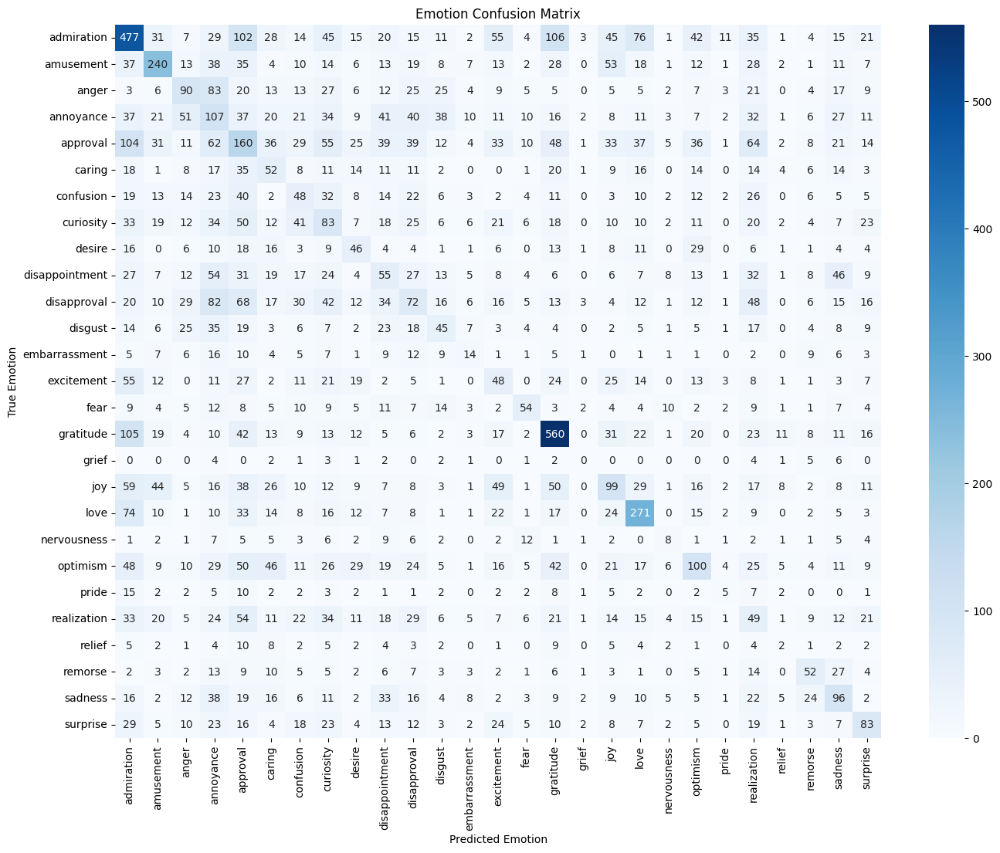

In [199]:
# lr = 0.001

emotion_labels = ['admiration', 'amusement', 'anger', 'annoyance', 'approval',
       'caring', 'confusion', 'curiosity', 'desire', 'disappointment',
       'disapproval', 'disgust', 'embarrassment', 'excitement', 'fear',
       'gratitude', 'grief', 'joy', 'love', 'nervousness', 'optimism', 'pride',
       'realization', 'relief', 'remorse', 'sadness', 'surprise']  # 예시

# Confusion Matrix 계산
conf_matrix_df = calculate_emotion_confusion_matrix(all_labels, all_preds, emotion_labels)

# Confusion Matrix 시각화
plt.figure(figsize=(16, 12))
sns.heatmap(conf_matrix_df, annot=True, fmt="d", cmap="Blues", xticklabels=emotion_labels, yticklabels=emotion_labels)
plt.title("Emotion Confusion Matrix")
plt.xlabel("Predicted Emotion")
plt.ylabel("True Emotion")
plt.show()

여전히 동일, loss는 작음, 각 label 모두 0이 1보다 훨씬 크니, 모델이 모두 0으로 예측해버리는것으로 추정

가중치를 더해줘야할듯함


In [183]:
# y_train_tensor에서 각 레이블의 긍정 및 부정 샘플 수 계산
positive_counts = (y_train_tensor.sum(dim=0)).cpu().numpy()  # 각 레이블에서 1의 개수
negative_counts = (y_train_tensor.size(0) - y_train_tensor.sum(dim=0)).cpu().numpy()  # 각 레이블에서 0의 개수

# 각 레이블에 대한 pos_weight 계산
pos_weights = torch.tensor(
    [neg / pos if pos > 0 else 0.0 for pos, neg in zip(positive_counts, negative_counts)]
).to(device)

In [184]:
pos_weights

tensor([ 11.0459,  20.7132,  24.4457,  15.1992,  10.8939,  34.1209,  27.2644,
         19.3364,  56.9473,  25.5273,  17.5702,  40.8333,  91.1836,  36.0956,
         65.7399,  15.7091, 308.9597,  25.2409,  23.3330, 118.0309,  22.8062,
        167.5547,  23.0166, 159.3611,  80.7416,  29.6463,  36.9179],
       device='cuda:0')

In [185]:
# BCEWithLogitsLoss에 pos_weight 전달
criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weights)

# 학습 루프
epochs = 10
for epoch in range(epochs):
    deep_model_glove.train()  # 학습 모드 활성화
    total_loss = 0

    progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}")
    for texts, labels in progress_bar:
        texts, labels = texts.to(device), labels.to(device)

        optimizer.zero_grad()  # 옵티마이저 초기화
        outputs = deep_model_glove(texts)  # 모델 출력
        loss = criterion(outputs, labels)  # pos_weight가 반영된 손실 계산
        loss.backward()  # 역전파
        optimizer.step()  # 가중치 업데이트

        total_loss += loss.item()
        progress_bar.set_postfix(loss=f"{loss.item():.4f}")

    avg_loss = total_loss / len(train_loader)
    print(f"Epoch {epoch+1}, Average Loss: {avg_loss:.4f}")


Epoch 1/10: 100%|██████████| 1444/1444 [00:07<00:00, 194.95it/s, loss=1.3036]


Epoch 1, Average Loss: 1.3397


Epoch 2/10: 100%|██████████| 1444/1444 [00:07<00:00, 195.51it/s, loss=1.1212]


Epoch 2, Average Loss: 1.3396


Epoch 3/10: 100%|██████████| 1444/1444 [00:07<00:00, 196.72it/s, loss=1.1306]


Epoch 3, Average Loss: 1.3396


Epoch 4/10: 100%|██████████| 1444/1444 [00:07<00:00, 196.66it/s, loss=0.8348]


Epoch 4, Average Loss: 1.3394


Epoch 5/10: 100%|██████████| 1444/1444 [00:07<00:00, 193.92it/s, loss=1.6860]


Epoch 5, Average Loss: 1.3399


Epoch 6/10: 100%|██████████| 1444/1444 [00:07<00:00, 196.31it/s, loss=1.7717]


Epoch 6, Average Loss: 1.3399


Epoch 7/10: 100%|██████████| 1444/1444 [00:07<00:00, 192.84it/s, loss=1.5189]


Epoch 7, Average Loss: 1.3398


Epoch 8/10: 100%|██████████| 1444/1444 [00:07<00:00, 197.74it/s, loss=1.6905]


Epoch 8, Average Loss: 1.3399


Epoch 9/10: 100%|██████████| 1444/1444 [00:07<00:00, 199.20it/s, loss=1.4588]


Epoch 9, Average Loss: 1.3398


Epoch 10/10: 100%|██████████| 1444/1444 [00:07<00:00, 197.95it/s, loss=1.1852]


Epoch 10, Average Loss: 1.3396


In [180]:
deep_model_glove.eval()  # 평가 모드 활성화
total_loss = 0
all_labels = []
all_preds = []

progress_bar = tqdm(test_loader, desc="Evaluating")

with torch.no_grad():
    for texts, labels in progress_bar:
        texts, labels = texts.to(device), labels.to(device)
        outputs = deep_model_glove(texts)

        loss = criterion(outputs, labels)
        total_loss += loss.item()

        probabilities = outputs  # Sigmoid가 이미 적용된 상태
        preds = (probabilities > 0.5).float()  # 0.5 임계값으로 이진화

        all_labels.append(labels.cpu())
        all_preds.append(preds.cpu())

        progress_bar.set_postfix(loss=f"{loss.item():.4f}")

avg_loss = total_loss / len(test_loader)
print(f"Test Loss: {avg_loss:.4f}")

# Confusion Matrix 출력
all_labels = torch.cat(all_labels).numpy()
all_preds = torch.cat(all_preds).numpy()


Evaluating: 100%|██████████| 361/361 [00:01<00:00, 295.18it/s, loss=1.4902]


Test Loss: 1.3491


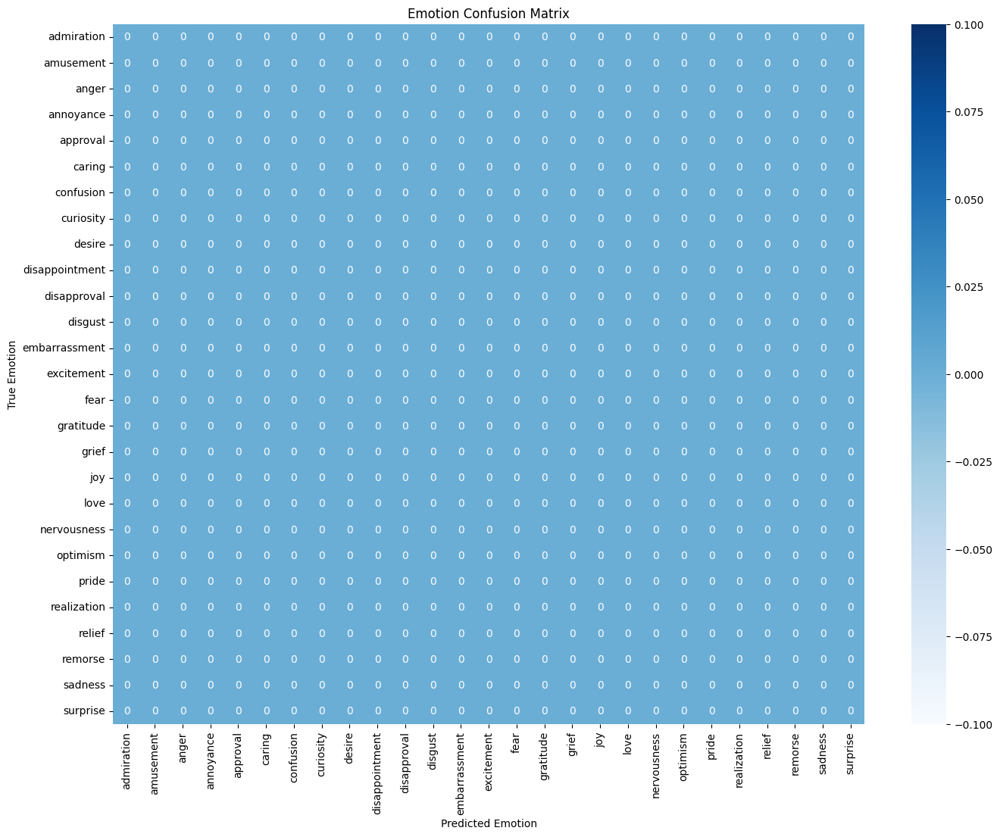

In [181]:
emotion_labels = ['admiration', 'amusement', 'anger', 'annoyance', 'approval',
       'caring', 'confusion', 'curiosity', 'desire', 'disappointment',
       'disapproval', 'disgust', 'embarrassment', 'excitement', 'fear',
       'gratitude', 'grief', 'joy', 'love', 'nervousness', 'optimism', 'pride',
       'realization', 'relief', 'remorse', 'sadness', 'surprise']  # 예시

# Confusion Matrix 계산
conf_matrix_df = calculate_emotion_confusion_matrix(all_labels, all_preds, emotion_labels)

# Confusion Matrix 시각화
plt.figure(figsize=(16, 12))
sns.heatmap(conf_matrix_df, annot=True, fmt="d", cmap="Blues", xticklabels=emotion_labels, yticklabels=emotion_labels)
plt.title("Emotion Confusion Matrix")
plt.xlabel("Predicted Emotion")
plt.ylabel("True Emotion")
plt.show()